## <p style="background-color:#0089bf; font-family:'Times New Roman', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> 🚘 CAR PRICE PREDICTION </p>

### **INTRODUCTION:**
**If we look at car companies, we see that they set different prices of cars based on a few set of factors such as horse power and other parameters. If a new company is planning to invest in manufacturing cars, it would be really useful for the company to understand some of the factors that affect the prices of the car respectively. It would be really useful if we are able to use machine learning in the prediction of the prices of cars and also predict the prices of different cars. With the help of machine learning and data science, it is possible to explore some useful insights about the car prices and other important features for the manufacture of the cars respectively. Once we understand that data, we would be able to provide insights to new companies that are willing to invest in the manufacture of different cars respectively.**

**IMPORTING LIBRARIES**

In [1]:
## importing necesssary libraries  
import numpy as np   
import matplotlib.pyplot as plt  
import seaborn as sns  
import statsmodels.formula.api as smf  
import statsmodels.api as sm    
import scipy.stats as stats 
import warnings 
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import PowerTransformer, QuantileTransformer,StandardScaler, OneHotEncoder,TargetEncoder
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor
from sklearn.pipeline import Pipeline 
from sklearn.linear_model import LinearRegression,Lasso  
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score,mean_absolute_percentage_error
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.cross_decomposition import PLSRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import VotingRegressor
from  lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
import shap
from feature_engine.outliers import Winsorizer
from lazypredict.Supervised import LazyRegressor
plt.rcParams['figure.dpi']=400
sns.set(style="whitegrid")
pd.set_option("display.max_columns", None)
from sklearn.ensemble import StackingRegressor
import missingno as msno
pd.set_option('display.float_format', '{:.2f}'.format)
from sklearn.decomposition import PCA
from sklearn import set_config
set_config(display='diagram')

In [2]:
## laoding the data  
car_price_data = pd.read_csv(r"D:\datasets\Car dataset\data.csv")
## laod the data  
car_price_data.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.00,6.00,MANUAL,rear wheel drive,2.00,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.00,6.00,MANUAL,rear wheel drive,2.00,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.00,6.00,MANUAL,rear wheel drive,2.00,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.00,6.00,MANUAL,rear wheel drive,2.00,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.00,6.00,MANUAL,rear wheel drive,2.00,Luxury,Compact,Convertible,28,18,3916,34500


### **Details of the Columns**
- **Make**: **Manufacturer of the car**
- **Mode**: **Specific Model of the Car**
- **Year**: **Year of the car it was manufactured**
- **Engine Fuel Type**: **Type of Fuel Used(eg.Petrol,Diesel)**
- **Egine Hp**: **Horse Power of the Egine**
- **Egine Cylinders**: **Number of Cylinders in the Egine**
- **Transmission Type**: **Gearbox Type(Manual or Automatic)**
- **Driven Wheels**: **Which Wheels Drive the Car**
- **Number of doors**: **Number of doors in the vechile**
- **Market Categorry**: **Marketing Segment of the Vehicle** 
- **Vechicle size**: **size classsification of the car**
- **HighWay MPG** : **Fuel Efficiency in HighWays**
- **City MPG** : **Fuel Efficiency in city driving**
- **Popularity**: **Popularity Index of the caar**
- **MSRP**: **Manufacturers Suggested Retail Price**


In [3]:
##  checking the shape of the data  
car_price_data.shape

(11914, 16)

In [4]:
## checking for general info  
car_price_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

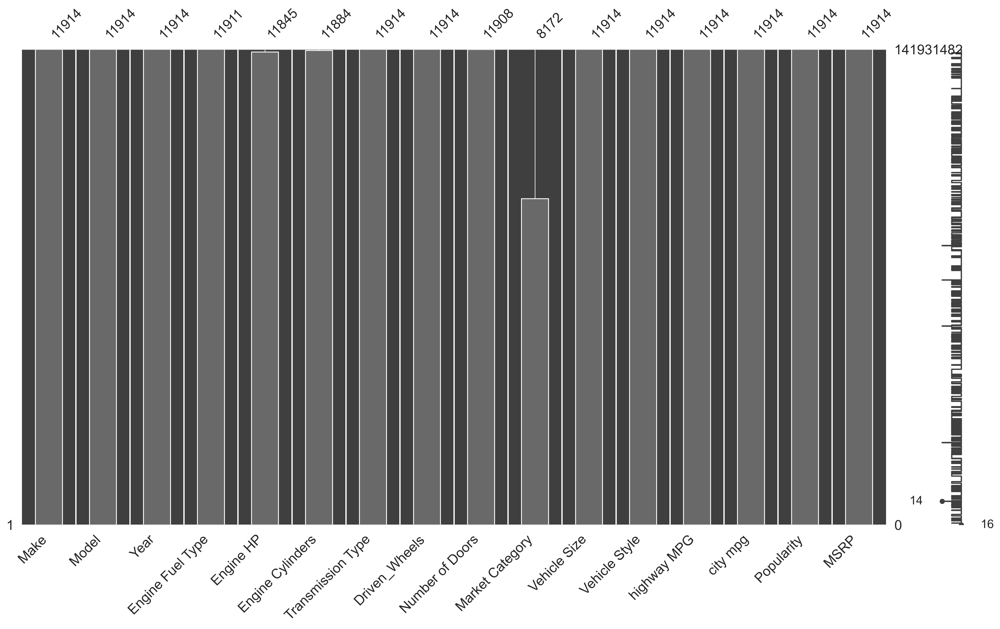

In [5]:
## Missingno 
msno.matrix(car_price_data,figsize=(20,5))
msno.bar(car_price_data,figsize=(20,10));

In [6]:
## checking for missing vvalues  
car_price_data.isnull().sum()

Make                    0
Model                   0
Year                    0
Engine Fuel Type        3
Engine HP              69
Engine Cylinders       30
Transmission Type       0
Driven_Wheels           0
Number of Doors         6
Market Category      3742
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
Popularity              0
MSRP                    0
dtype: int64

In [7]:
## checking for the percentage of  missing values  
car_price_data.isnull().mean()*100

Make                 0.00
Model                0.00
Year                 0.00
Engine Fuel Type     0.03
Engine HP            0.58
Engine Cylinders     0.25
Transmission Type    0.00
Driven_Wheels        0.00
Number of Doors      0.05
Market Category     31.41
Vehicle Size         0.00
Vehicle Style        0.00
highway MPG          0.00
city mpg             0.00
Popularity           0.00
MSRP                 0.00
dtype: float64

In [8]:
## checking for duplicates  
car_price_data.duplicated().sum()

715

In [9]:
## removing duplicates  
car_price_data = car_price_data.drop_duplicates(keep='first')
## checking for duplicates  again
car_price_data.duplicated().sum()

0

In [10]:
## checking for descriptive stats  
car_price_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,11199.00,2010.71,7.23,1990.00,2007.00,2015.00,2016.00,2017.00
Engine HP,11130.00,253.39,110.15,55.00,172.00,239.00,303.00,1001.00
Engine Cylinders,11169.00,5.67,1.80,0.00,4.00,6.00,6.00,16.00
Number of Doors,11193.00,3.45,0.87,2.00,2.00,4.00,4.00,4.00
highway MPG,11199.00,26.61,8.98,12.00,22.00,25.00,30.00,354.00
city mpg,11199.00,19.73,9.18,7.00,16.00,18.00,22.00,137.00
Popularity,11199.00,1558.48,1445.67,2.00,549.00,1385.00,2009.00,5657.00
MSRP,11199.00,41925.93,61535.05,2000.00,21599.50,30675.00,43032.50,2065902.00


In [11]:
### displaying the categorical options 
car_price_data.describe(include=['object']).T

,count,unique,top,freq
Make,11199,48,Chevrolet,1083
Model,11199,915,Silverado 1500,156
Engine Fuel Type,11196,10,regular unleaded,6658
Transmission Type,11199,5,AUTOMATIC,7932
Driven_Wheels,11199,4,front wheel drive,4354
Market Category,7823,71,Crossover,1075
Vehicle Size,11199,3,Compact,4395
Vehicle Style,11199,16,Sedan,2843


### **DATA DISTRIBUTIONS**
- **Numeric Distributions**

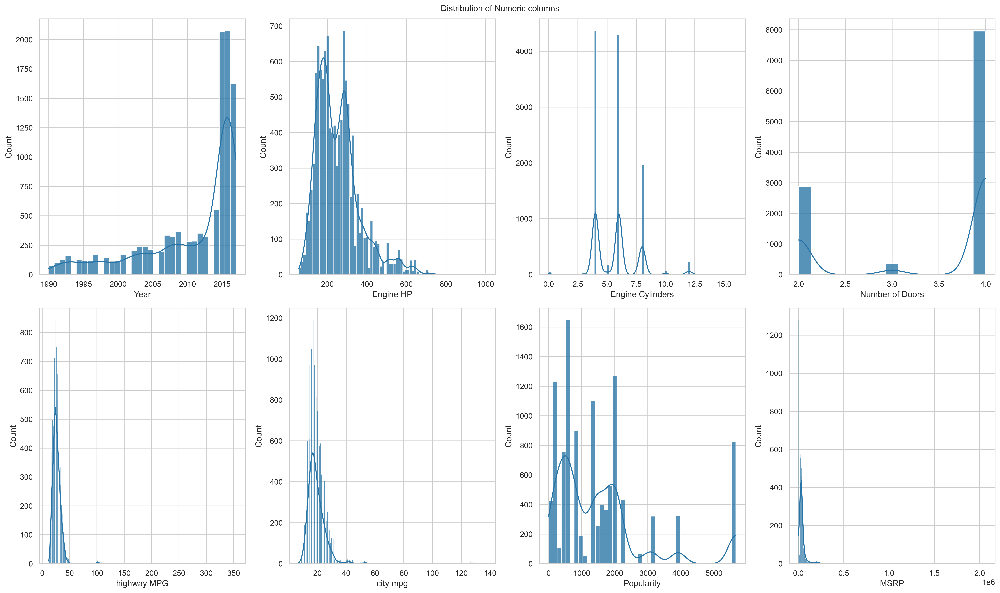

In [12]:
## Numeric Distributions  
## creating a list of numeriic clumns  
numeric_clumns = car_price_data.select_dtypes(include=['float','int']).columns.to_list()
## defininh the number of ncols  
n_cols = 4 
## defining how many rows are needed to fit 4 columns  
n_rows = int(np.ceil(len(numeric_clumns)/ n_cols))  
## creating the figure 
fig , axes = plt.subplots(nrows=n_rows,ncols=n_cols,figsize=(20,12))
## flattening the axes  
axes = axes.flatten()
## loop through
for i , column in enumerate(numeric_clumns):  
    sns.histplot(data=car_price_data,x=column,ax=axes[i],kde=True,color='#2874a6',alpha=0.78)
    # axes[i].set_title(f'{column} Distribution')
    plt.suptitle("Distribution of Numeric columns",fontsize=12)
    axes[i].set_ylabel(f'Count')
    axes[i].set_xlabel(column)
for j in range(i+1,n_rows*n_cols):  
    axes[j].axis('off')
## adjusting the subplots  
plt.tight_layout()
plt.show()

* Categorical Distributions

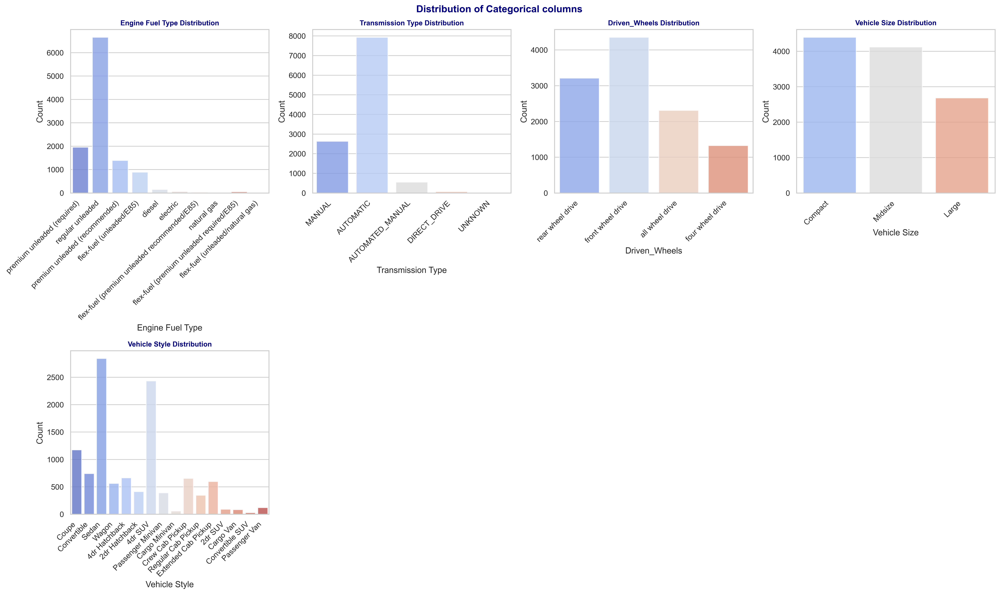

In [13]:
## categorical distributions
## creating a list of categorical columns
categorical_columns = car_price_data.select_dtypes(include=['object']).columns.to_list()
## remove Make, Model and Market Category
for col in ['Make', 'Model', 'Market Category']:
    if col in categorical_columns:
        categorical_columns.remove(col)
## defining the number of ncols
n_cols = 4
## defining how many rows are needed to fit 4 columns
n_rows = int(np.ceil(len(categorical_columns)/ n_cols))
## creating the figure
fig , axes = plt.subplots(nrows=n_rows,ncols=n_cols,figsize=(20,12))
## flattening the axes
axes = axes.flatten()
## loop through
for i , column in enumerate(categorical_columns):
    sns.countplot(data=car_price_data,x=column,ax=axes[i],palette='coolwarm',alpha=0.78)
    # axes[i].set_title(f'{column} Distribution')
    plt.suptitle("Distribution of Categorical columns", fontsize=14, fontweight='bold', color='navy', y=0.98)
    axes[i].set_ylabel(f'Count')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha="right")
    axes[i].set_title(f'{column} Distribution', fontsize=10,fontweight='bold',color='navy')    
for j in range(i+1,n_rows*n_cols):
    axes[j].axis('off')
## adjusting the subplots
plt.tight_layout()
plt.show()

* Boxplots for numeric cols

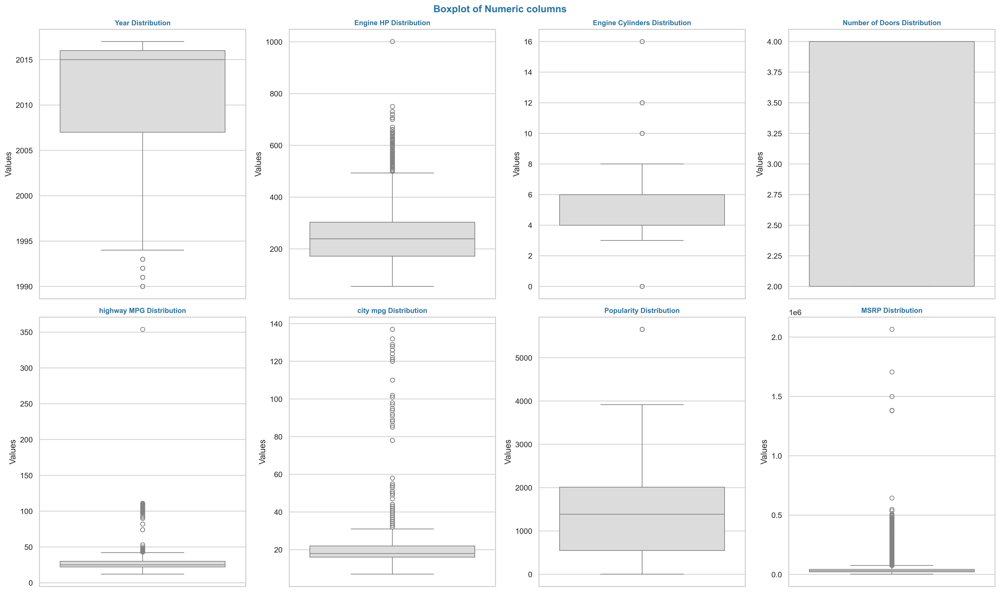

In [14]:
## boxplot of numeric columns
## creating a list of numeric columns
numeric_columns = car_price_data.select_dtypes(include=['float64','int64']).columns.to_list()
## remove MSRP (target variable)
## defining the number of ncols
n_cols = 4
## defining how many rows are needed to fit 4 columns
n_rows = int(np.ceil(len(numeric_columns)/ n_cols))
## creating the figure
fig , axes = plt.subplots(nrows=n_rows,ncols=n_cols,figsize=(20,12))
## flattening the axes
axes = axes.flatten()
## loop through
for i , column in enumerate(numeric_columns):
    sns.boxplot(data=car_price_data,y=column,ax=axes[i],palette='coolwarm')
    # axes[i].set_title(f'{column} Distribution')
    plt.suptitle("Boxplot of Numeric columns", fontsize=14, fontweight='bold', color='#2874a6', y=0.98)
    axes[i].set_ylabel(f'Values')
    axes[i].set_title(f'{column} Distribution', fontsize=10,fontweight='bold',color='#2874a6')
for j in range(i+1,n_rows*n_cols):
    axes[j].axis('off')
## adjusting the subplots
plt.tight_layout()
plt.show()

In [15]:
# Renaming the columns for better clarity and consistency in the dataset
car_price_data.rename(columns={
    'Make': 'Brand',
    'Engine Fuel Type': 'Fuel_Type',
    'Engine HP': 'Horsepower',
    'Engine Cylinders': 'Cylinders',
    'Transmission Type': 'Transmission',
    'Driven_Wheels': 'Drive_Type',
    'Number of Doors': 'Doors',
    'Market Category': 'Market_Category',
    'Vehicle Size': 'Vehicle_Size',
    'Vehicle Style': 'Vehicle_Style',
    'highway MPG': 'Highway_MPG',
    'city mpg': 'city_mpg',
    'MSRP': 'Price'
}, inplace=True)

In [16]:
## checking the data  
car_price_data.head()

,Brand,Model,Year,Fuel_Type,Horsepower,Cylinders,Transmission,Drive_Type,Doors,Market_Category,Vehicle_Size,Vehicle_Style,Highway_MPG,city_mpg,Popularity,Price
0,BMW,1 Series M,2011,premium unleaded (required),335.00,6.00,MANUAL,rear wheel drive,2.00,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.00,6.00,MANUAL,rear wheel drive,2.00,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.00,6.00,MANUAL,rear wheel drive,2.00,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.00,6.00,MANUAL,rear wheel drive,2.00,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.00,6.00,MANUAL,rear wheel drive,2.00,Luxury,Compact,Convertible,28,18,3916,34500


#### <p style="background-color:#0089bf; font-family:'Times New Roman', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> EDA (Exploratory Data Analysis)</p>

### **Transmission**

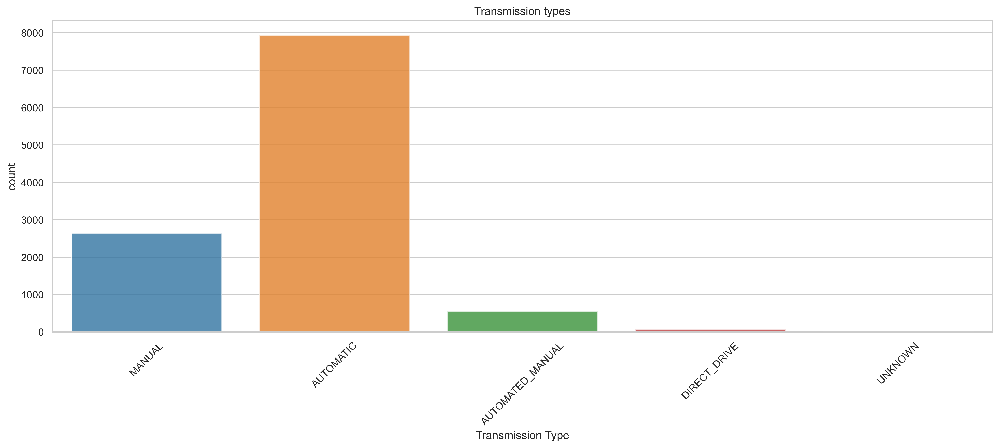

In [17]:
# Count the occurrences of each transmission type in dataset
plt.figure(figsize=(18, 6))
sns.countplot(x='Transmission', data=car_price_data, palette='tab10', alpha=0.8)
plt.xticks(rotation=45)
plt.xlabel('Transmission Type', fontsize=12)
plt.title('Transmission types')
plt.show()

**There is a large number of automatic cars in our dataset, but there are also some entries with unknown transmission types. Therefore, we will remove the rows where the transmission type is unknown to ensure the integrity of our analysis.**

In [18]:
# Filter the dataset for rows where Transmission is 'UNKNOWN'
car_price_data[car_price_data['Transmission'] == 'UNKNOWN'].shape

(12, 16)

In [19]:
# Remove rows where the Transmission type is unknown
car_price_data = car_price_data[car_price_data['Transmission'] != 'UNKNOWN']
## check the shape of the data again
car_price_data.shape

(11187, 16)

### **Fuel_Type**

In [20]:
## checking for the unique values in Fuel_Type  
car_price_data['Fuel_Type'].unique()

array(['premium unleaded (required)', 'regular unleaded',
       'premium unleaded (recommended)', 'flex-fuel (unleaded/E85)',
       'diesel', 'electric',
       'flex-fuel (premium unleaded recommended/E85)', 'natural gas',
       'flex-fuel (premium unleaded required/E85)',
       'flex-fuel (unleaded/natural gas)', nan], dtype=object)

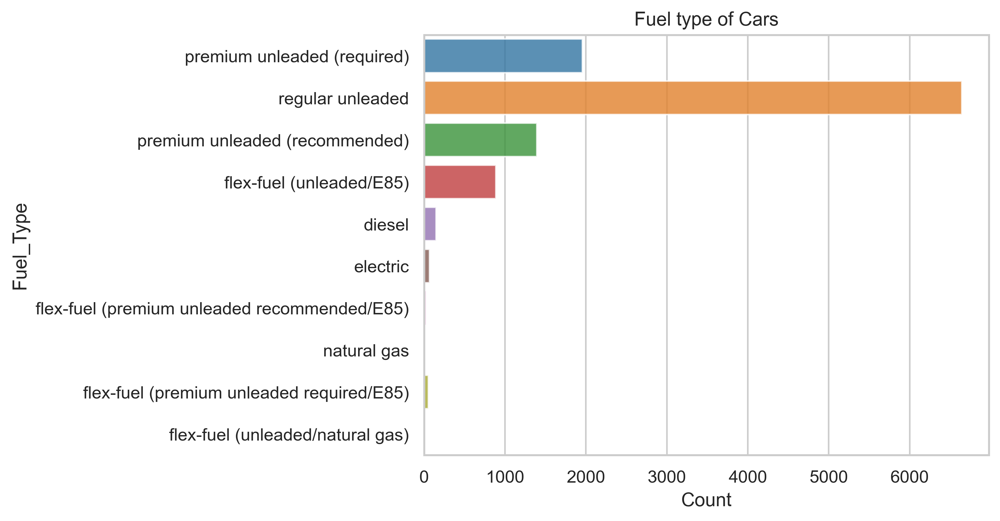

In [21]:
 # Count the occurrences of each fuel type in the dataset
sns.countplot(y='Fuel_Type', data=car_price_data, palette='tab10', alpha=0.8)
plt.xlabel('Count', fontsize=12)
plt.title('Fuel type of Cars')
plt.show()

**We can See that regular unleaded cars have highest number in dataset**

### **YEAR**

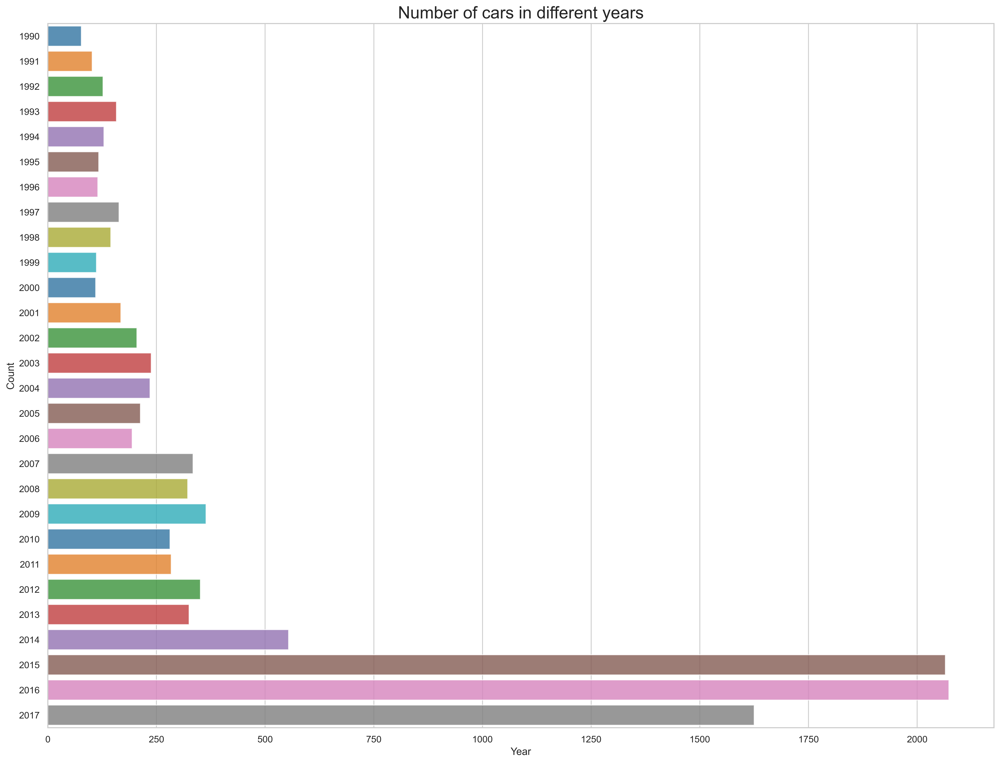

In [22]:
## count occurences of year in the dataset
plt.figure(figsize = (20, 15))
sns.countplot(y='Year', palette = 'tab10', alpha = 0.8,data=car_price_data)
plt.xlabel('Year', fontsize = 12)
plt.ylabel('Count', fontsize = 12)
plt.title("Number of cars in different years", fontsize = 20)
plt.show()



**We can see that mpst of the cars were manucfactured from 2015 to 2017**

### **Vechicle_Size**

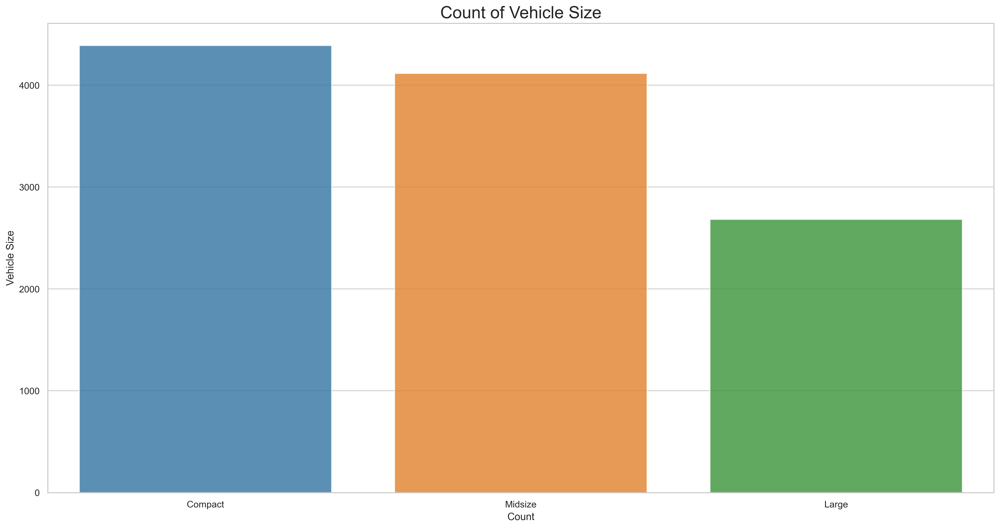

In [23]:
## Count plot for vehicle size
plt.figure(figsize=(20, 10))
sns.countplot(x='Vehicle_Size', data=car_price_data, palette='tab10', alpha=0.8)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Vehicle Size', fontsize=12)
plt.title('Count of Vehicle Size', fontsize=20)
plt.show()

**There are mostly compact cars in our data followed by Midsize cars. There are just a few cars that are large compared to compact and midsize cars.**

### **Brand**

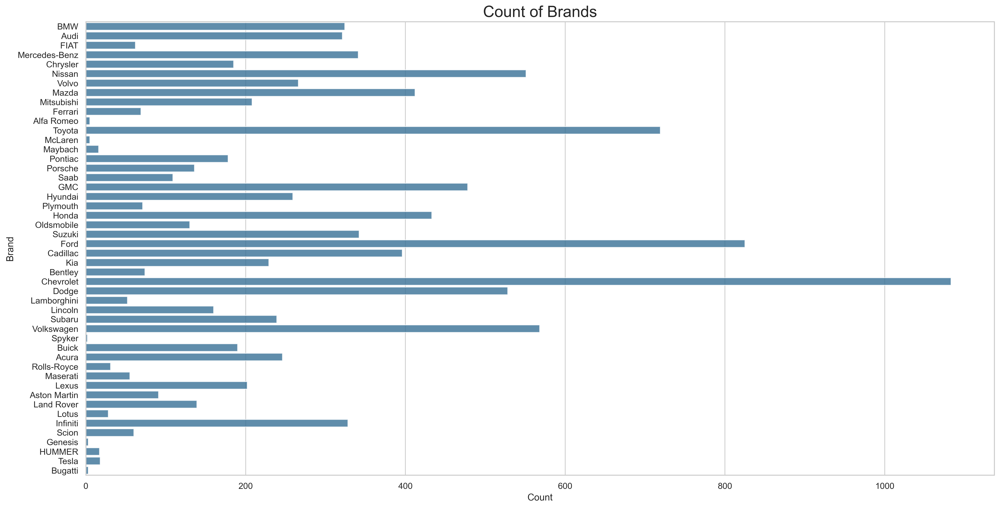

In [24]:
## Count plot for the Brand
plt.figure(figsize=(20, 10))
sns.countplot(y='Brand', data=car_price_data,color="#2874a6", alpha=0.8)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Brand', fontsize=12)
plt.title('Count of Brands', fontsize=20)
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
plt.show()

### **Drive Type**

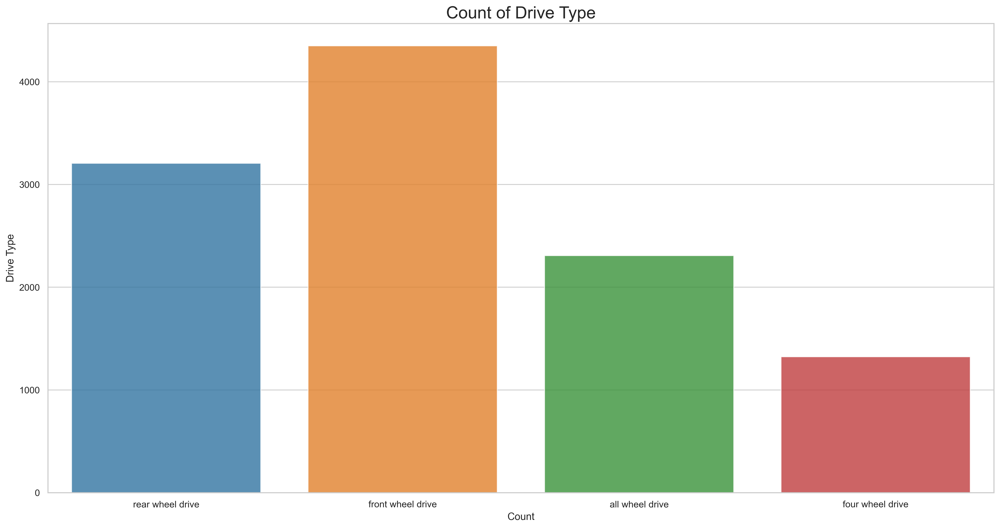

In [25]:
## countplot for Drive_Type
plt.figure(figsize=(20, 10))
sns.countplot(x='Drive_Type', data=car_price_data, palette='tab10', alpha=0.8)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Drive Type', fontsize=12)
plt.title('Count of Drive Type', fontsize=20)
plt.show()

#### <p style="background-color:#0089bf; font-family:'Dancing Script', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> Bivariate Analysis</p>

### **Drive_Type vs Brand**

In [26]:
## Drive_Type vs Brand  
pd.crosstab(car_price_data['Drive_Type'], car_price_data['Brand'],normalize='index')*100


Brand,Acura,Alfa Romeo,Aston Martin,Audi,BMW,Bentley,Bugatti,Buick,Cadillac,Chevrolet,Chrysler,Dodge,FIAT,Ferrari,Ford,GMC,Genesis,HUMMER,Honda,Hyundai,Infiniti,Kia,Lamborghini,Land Rover,Lexus,Lincoln,Lotus,Maserati,Maybach,Mazda,McLaren,Mercedes-Benz,Mitsubishi,Nissan,Oldsmobile,Plymouth,Pontiac,Porsche,Rolls-Royce,Saab,Scion,Spyker,Subaru,Suzuki,Tesla,Toyota,Volkswagen,Volvo
Drive_Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
all wheel drive,2.86,0.00,0.00,11.01,6.02,2.08,0.13,2.04,5.29,2.17,1.26,1.86,0.30,0.13,4.07,1.82,0.04,0.00,2.77,1.56,4.68,1.17,1.86,2.30,2.56,1.95,0.00,0.39,0.00,2.47,0.00,5.50,1.34,2.25,0.39,0.26,0.74,3.29,0.00,1.47,0.00,0.00,8.88,2.25,0.48,3.16,2.90,4.29
four wheel drive,0.30,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.72,18.90,0.53,7.03,0.00,0.00,11.87,13.00,0.00,1.28,2.04,0.00,0.91,0.38,0.00,6.50,1.36,1.13,0.00,0.00,0.00,2.27,0.00,0.38,2.65,8.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.68,4.38,0.00,13.53,0.08,0.00
front wheel drive,3.95,0.00,0.00,1.54,0.02,0.00,0.00,3.03,1.54,8.53,2.69,4.14,1.20,0.00,5.59,0.78,0.00,0.00,7.47,4.46,0.53,4.32,0.00,0.00,1.08,1.20,0.00,0.00,0.00,4.97,0.00,0.21,2.57,4.64,2.62,1.43,2.99,0.00,0.00,1.72,1.10,0.00,0.30,3.98,0.00,7.20,11.43,2.78
rear wheel drive,0.12,0.16,2.84,0.00,5.74,0.81,0.00,0.34,5.33,12.85,1.00,6.61,0.09,2.06,10.32,7.17,0.06,0.00,0.53,0.90,5.77,0.28,0.28,0.00,2.43,1.50,0.87,1.43,0.50,3.40,0.16,6.24,0.94,5.93,0.22,0.09,0.97,1.87,0.97,0.00,0.37,0.06,0.37,1.84,0.22,4.80,0.09,1.43


* **In "all wheel drive," Audi has 11.01%, indicating that 11.01% of all wheel drive cars in the dataset are from Audi**

In [27]:
pd.crosstab(car_price_data['Brand'], car_price_data['Drive_Type'],normalize='index')*100

Drive_Type,all wheel drive,four wheel drive,front wheel drive,rear wheel drive
Brand,,,,
Acura,26.83,1.63,69.92,1.63
Alfa Romeo,0.00,0.00,0.00,100.00
Aston Martin,0.00,0.00,0.00,100.00
Audi,79.13,0.00,20.87,0.00
BMW,42.90,0.00,0.31,56.79
Bentley,64.86,0.00,0.00,35.14
Bugatti,100.00,0.00,0.00,0.00
Buick,24.74,0.00,69.47,5.79
Cadillac,30.81,9.09,16.92,43.18


### **Brand vs Maximum Horsepower**

In [28]:
## Brarnd vs Maxumum Horsepower
# Check the Top 10 Car Brands with the Highest Horsepower
top_hp = car_price_data.groupby('Brand')['Horsepower'].max().sort_values(ascending=False).reset_index().head(10)
top_hp

,Brand,Horsepower
0,Bugatti,1001.00
1,Lamborghini,750.00
2,Ferrari,731.00
3,Dodge,707.00
4,Ford,662.00
5,Chevrolet,650.00
6,McLaren,641.00
7,Mercedes-Benz,641.00
8,Cadillac,640.00
9,Maybach,631.00


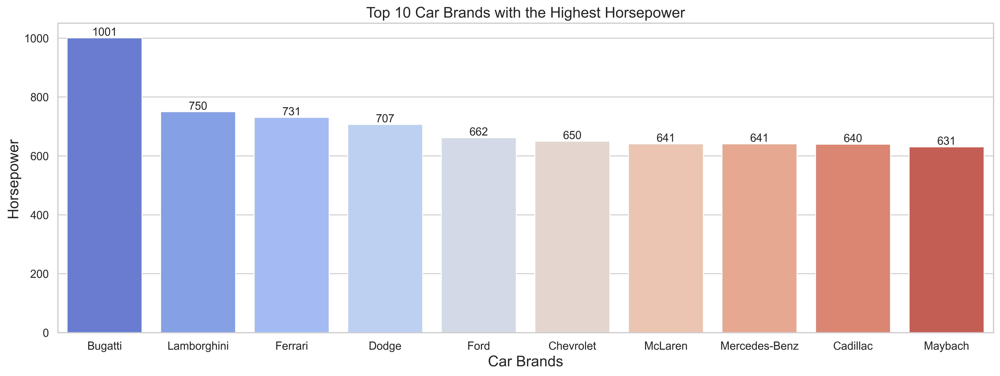

In [29]:
# Plot the Top 10 Car Brands with the Highest Horsepower
plt.figure(figsize=(18, 6))
fig = sns.barplot(x='Brand', y = 'Horsepower', data=top_hp, palette = 'coolwarm')
plt.title('Top 10 Car Brands with the Highest Horsepower', fontsize = 16)
plt.xlabel('Car Brands', fontsize = 16)
plt.ylabel('Horsepower', fontsize = 16)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)

for i in fig.containers:
    fig.bar_label(i, fontsize = 12)
    
    
plt.show()

We can see that **Bugatti**, **Lamborghini**, and **Ferrari** lead in horsepower, showcasing their dominance in high-performance vehicles. Luxury brands like Bentley, Rolls-Royce, and Maybach also boast impressive horsepower, reflecting their commitment to powerful yet opulent cars. On the other hand, more affordable or mainstream brands like Toyota, Honda, and Tesla offer vehicles with significantly lower horsepower,catering to everyday consumers focused on efficiency rather than extreme power.

### **Fuel_Type vs Cylinder**

In [30]:
# Determine which fuel type of vehicles has the highest number of cylinders
fc = car_price_data.groupby(['Fuel_Type'])['Cylinders'].count().sort_values(ascending=False).reset_index()
fc

,Fuel_Type,Cylinders
0,regular unleaded,6643
1,premium unleaded (required),1939
2,premium unleaded (recommended),1392
3,flex-fuel (unleaded/E85),887
4,diesel,150
5,electric,56
6,flex-fuel (premium unleaded required/E85),53
7,flex-fuel (premium unleaded recommended/E85),26
8,flex-fuel (unleaded/natural gas),6
9,natural gas,2


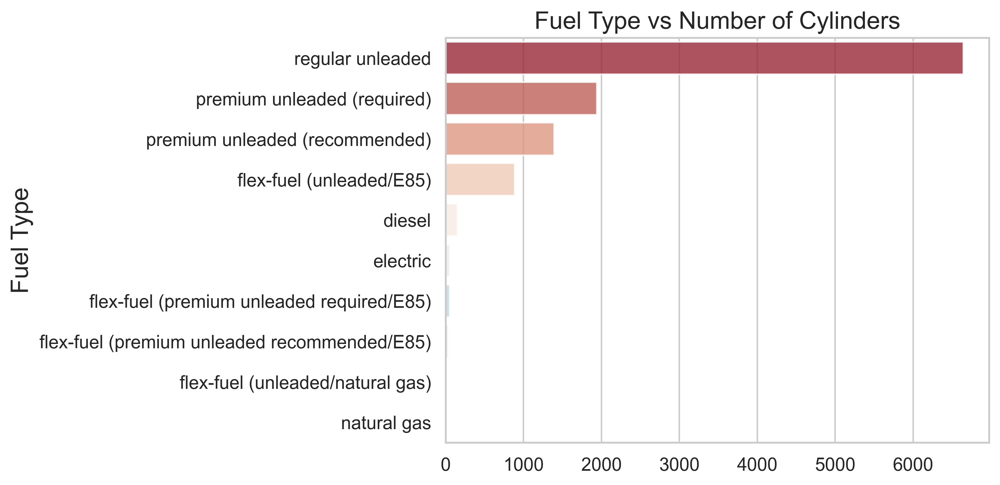

In [31]:
## plottting the barplott  
sns.barplot(y = 'Fuel_Type', x='Cylinders', data = fc,palette = 'RdBu', alpha = 0.8)
plt.title('Fuel Type vs Number of Cylinders', fontsize = 16)
plt.ylabel('Fuel Type', fontsize = 16)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('')
plt.show()


### **Brand vs Popularity**

In [32]:
## Brand vs Popularity 
top_brands = car_price_data.groupby('Brand')['Popularity'].sum().reset_index().sort_values(by='Popularity', ascending=False).head(10)
top_brands

,Brand,Popularity
14,Ford,4667025
9,Chevrolet,1499955
45,Toyota,1460289
4,BMW,1268784
33,Nissan,1106959
3,Audi,996705
11,Dodge,977328
18,Honda,953466
8,Cadillac,643104
46,Volkswagen,495864


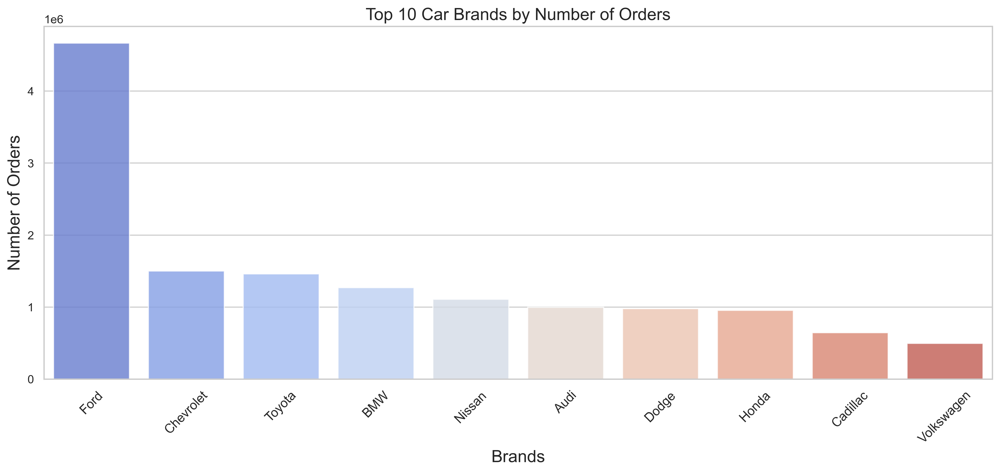

In [33]:
# Plot the Top 10 Brands of Cars
plt.figure(figsize=(16, 6))
plt.xticks(rotation=45, fontsize=12)

fig = sns.barplot(data = top_brands, x='Brand', y= 'Popularity', palette = 'coolwarm', alpha = 0.8)
plt.xlabel('Brands', size=16)
plt.ylabel('Number of Orders', size=16)
plt.title('Top 10 Car Brands by Number of Orders', size=16)
plt.show()

### **Brand vs Price**

In [34]:
# Check the top 10 Highest Price Cars
top_price = car_price_data.groupby('Brand')['Price'].mean().sort_values(ascending=False).reset_index().head(10)
top_price

,Brand,Price
0,Bugatti,1757223.67
1,Maybach,546221.88
2,Rolls-Royce,351130.65
3,Lamborghini,331567.31
4,Bentley,247169.32
5,McLaren,239805.00
6,Ferrari,238218.84
7,Spyker,214990.00
8,Aston Martin,198123.46
9,Maserati,113684.49


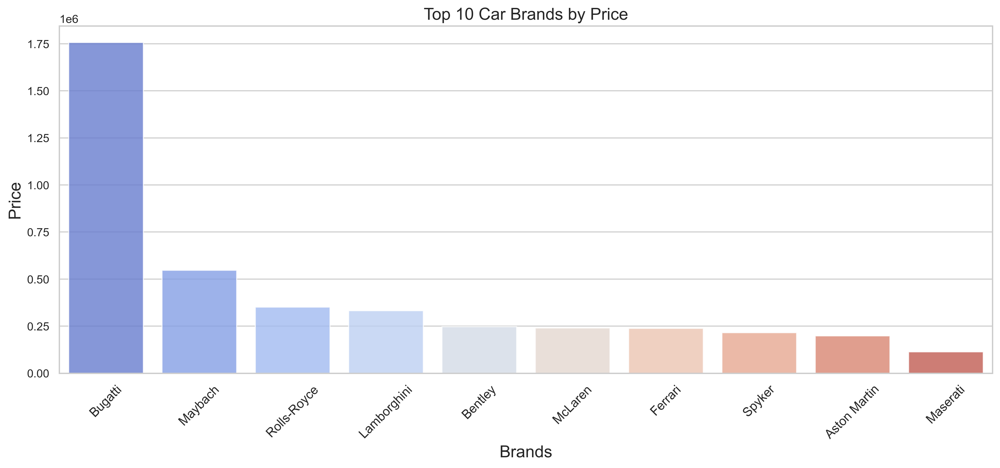

In [35]:
## plotting the top 10 highest price cars
plt.figure(figsize=(16, 6))
plt.xticks(rotation=45, fontsize=12)
fig = sns.barplot(data = top_price, x='Brand', y= 'Price', palette = 'coolwarm', alpha = 0.8)
plt.xlabel('Brands', size=16)
plt.ylabel('Price', size=16)
plt.title('Top 10 Car Brands by Price', size=16)
plt.show()

### **Brand vs Fuel Type**

In [36]:
pd.crosstab(car_price_data['Fuel_Type'],car_price_data['Brand'],normalize='index')*100

Brand,Acura,Alfa Romeo,Aston Martin,Audi,BMW,Bentley,Bugatti,Buick,Cadillac,Chevrolet,Chrysler,Dodge,FIAT,Ferrari,Ford,GMC,Genesis,HUMMER,Honda,Hyundai,Infiniti,Kia,Lamborghini,Land Rover,Lexus,Lincoln,Lotus,Maserati,Maybach,Mazda,McLaren,Mercedes-Benz,Mitsubishi,Nissan,Oldsmobile,Plymouth,Pontiac,Porsche,Rolls-Royce,Saab,Scion,Spyker,Subaru,Suzuki,Tesla,Toyota,Volkswagen,Volvo
Fuel_Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
diesel,0.00,0.00,0.00,18.67,13.33,0.00,0.00,0.00,0.00,0.67,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.67,0.00,0.00,0.00,0.00,0.00,0.00,0.00,17.33,0.00,0.00,0.00,0.00,0.00,1.33,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,46.00,0.00
electric,0.00,0.00,0.00,0.00,6.06,0.00,0.00,0.00,0.00,12.12,0.00,0.00,4.55,0.00,4.55,0.00,0.00,0.00,3.03,0.00,0.00,7.58,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.55,4.55,15.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,27.27,4.55,6.06,0.00
flex-fuel (premium unleaded recommended/E85),0.00,0.00,0.00,19.23,0.00,0.00,0.00,0.00,34.62,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,46.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
flex-fuel (premium unleaded required/E85),0.00,0.00,0.00,0.00,0.00,45.28,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,54.72,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
flex-fuel (unleaded/E85),0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.17,5.19,28.30,5.19,5.52,0.00,0.00,24.69,15.22,0.00,0.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.90,0.00,0.00,0.00,1.92,0.00,0.00,0.00,0.00,0.00,0.79,0.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.76,0.79,0.00
flex-fuel (unleaded/natural gas),0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
natural gas,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
premium unleaded (recommended),10.49,0.00,0.00,6.75,1.94,0.00,0.00,2.08,7.97,6.11,0.00,2.16,3.30,0.00,4.67,0.86,0.07,0.00,0.14,1.87,11.35,0.22,0.00,4.09,0.57,1.29,0.43,0.00,0.00,2.87,0.00,0.29,1.15,3.23,0.00,0.00,0.43,0.00,0.00,3.52,0.00,0.00,1.08,0.00,0.00,0.14,18.10,2.80
premium unleaded (required),2.04,0.26,4.65,7.62,13.45,2.56,0.15,0.15,2.15,1.64,0.97,1.12,0.00,3.53,0.77,0.00,0.00,0.00,0.87,0.00,7.11,0.00,2.66,1.79,6.29,1.28,1.12,2.81,0.82,1.84,0.26,12.63,0.97,3.12,0.15,0.05,0.77,6.19,1.58,0.36,0.61,0.10,3.53,0.00,0.00,0.51,1.28,0.26


#### <p style="background-color:#0089bf; font-family:'Times New Roman', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> Multivariate Analysis</p>

In [37]:
# Check top 10 Year by popularity  according to dataset
top_brands = car_price_data.groupby(['Year', 'Brand'])['Popularity'].sum().reset_index().sort_values(by='Popularity', ascending=False).head(10)
top_brands

,Year,Brand,Popularity
714,2017,Ford,882492
681,2016,Ford,859864
645,2015,Ford,741067
702,2016,Toyota,369642
636,2015,BMW,368104
673,2016,BMW,364188
666,2015,Toyota,339177
732,2017,Toyota,333084
707,2017,BMW,309364
660,2015,Nissan,307377


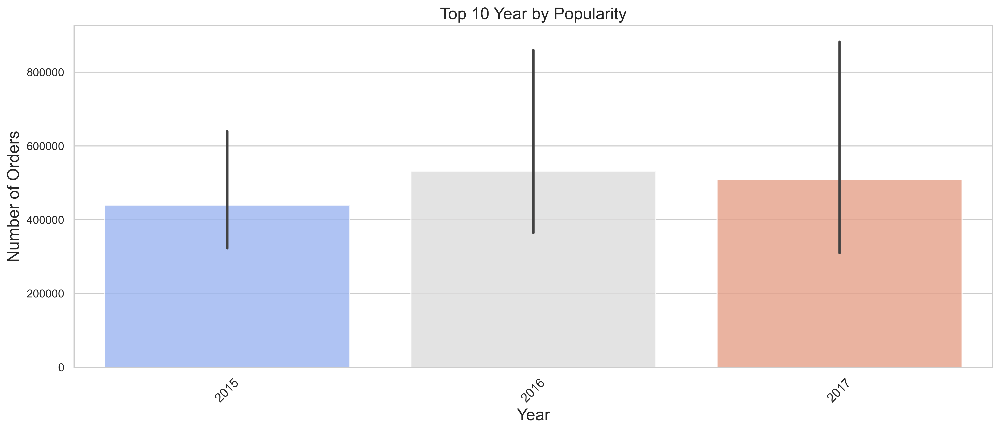

In [38]:
## plotting 
plt.figure(figsize=(16, 6))
plt.xticks(rotation=45, fontsize=12)
fig = sns.barplot(data = top_brands, x='Year', y= 'Popularity', palette = 'coolwarm', alpha = 0.8)
plt.xlabel('Year', size=16)
plt.ylabel('Number of Orders', size=16)
plt.title('Top 10 Year by Popularity', size=16)
plt.show()

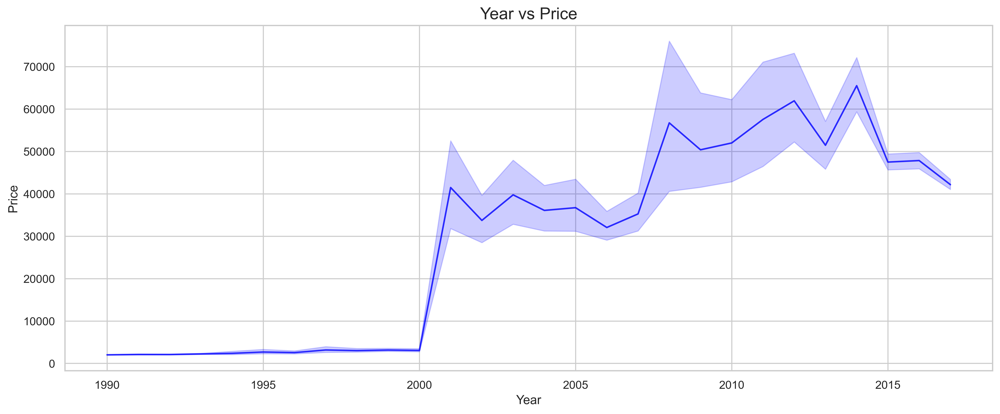

In [39]:
# Checking relationship of Year with Price
plt.figure(figsize=(16, 6))
sns.lineplot(x='Year',y='Price',data=car_price_data, color='blue', alpha=0.8)
plt.title('Year vs Price', fontsize=16)
plt.show()

### **Pivot Table on Fuel_Type vs Price**

In [40]:
#Pivot table for 'Fuel_Type' vs 'Price'
car_price_data.pivot_table(values='Price', index='Fuel_Type', aggfunc='mean').sort_values(by='Price', ascending=False)

,Price
Fuel_Type,
flex-fuel (premium unleaded required/E85),160692.26
premium unleaded (required),102814.09
flex-fuel (premium unleaded recommended/E85),48641.92
electric,47943.03
premium unleaded (recommended),41812.51
diesel,40449.68
flex-fuel (unleaded/natural gas),39194.17
flex-fuel (unleaded/E85),36279.22
natural gas,28065.00


In [41]:
# Pivot table for 'Drive_Type' vs 'Price'
pivot_drive_type_price = car_price_data.pivot_table(values='Price', index='Drive_Type', aggfunc='mean')
print(pivot_drive_type_price.sort_values(by='Price', ascending=False))

                     Price
Drive_Type                
all wheel drive   59006.26
rear wheel drive  57123.76
four wheel drive  36712.12
front wheel drive 23353.87


In [42]:
# Pivot table for 'Vehicle_Size' vs 'Price'
car_price_data.pivot_table(values='Price', index='Vehicle_Size', aggfunc='mean').sort_values(by='Price', ascending=False)

,Price
Vehicle_Size,
Large,55372.02
Midsize,40073.05
Compact,35551.67


In [43]:
# Pivot table for 'Vehicle_Style' vs 'Price'
car_price_data.pivot_table(values='Price', index='Vehicle_Style', aggfunc='mean').sort_values(by='Price', ascending=False)

,Price
Vehicle_Style,
Convertible,88439.89
Coupe,77724.18
4dr SUV,40730.27
Sedan,40475.55
Crew Cab Pickup,37183.11
Passenger Van,30578.07
Passenger Minivan,26176.56
Wagon,26156.94
Extended Cab Pickup,23041.77


The **Convertible** and **Coupe** vehicle styles have the highest average prices at $84,422.62 and $77,210.13, respectively, while **2dr SUV** and **Cargo Van** have the lowest average prices at $10,346.36 and $15,280.22, respectively. Overall, **SUVs** and **Sedans** show mid-range pricing between $40,418.10 and $39,282.92.

### **Correlation Analysis**

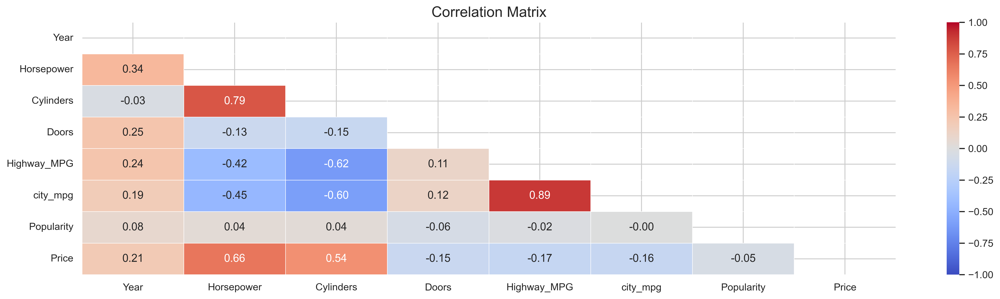

In [44]:
## correlation matrix
mask = np.triu(np.ones_like(car_price_data.corr(numeric_only=True), dtype=bool))
plt.figure(figsize=(20, 5))
sns.heatmap(car_price_data.corr(numeric_only=True),annot=True,fmt='.2f',cmap='coolwarm',linewidths=0.5,mask=mask,vmax=1,vmin=-1)
plt.title('Correlation Matrix', fontsize=16)
plt.show()



In [45]:
car_price_data.corr(numeric_only=True)['Price'].sort_values(ascending=False)

Price          1.00
Horsepower     0.66
Cylinders      0.54
Year           0.21
Popularity    -0.05
Doors         -0.15
city_mpg      -0.16
Highway_MPG   -0.17
Name: Price, dtype: float64

#### <p style="background-color:#0089bf; font-family:'Times New Roman', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> STATISTICAL ANALYSIS</p>

### **ANOVA ANALYSIS**

In [46]:
### displaying the categorical options 
car_price_data.describe(include=['object']).T

,count,unique,top,freq
Brand,11187,48,Chevrolet,1083
Model,11187,915,Silverado 1500,156
Fuel_Type,11184,10,regular unleaded,6646
Transmission,11187,4,AUTOMATIC,7932
Drive_Type,11187,4,front wheel drive,4350
Market_Category,7820,71,Crossover,1075
Vehicle_Size,11187,3,Compact,4389
Vehicle_Style,11187,16,Sedan,2842


In [47]:
cat = ['Transmission', 'Drive_Type', 'Vehicle_Size']
target = ['Price']
cat_target = cat + target
car_price_data[cat_target].head()   

,Transmission,Drive_Type,Vehicle_Size,Price
0,MANUAL,rear wheel drive,Compact,46135
1,MANUAL,rear wheel drive,Compact,40650
2,MANUAL,rear wheel drive,Compact,36350
3,MANUAL,rear wheel drive,Compact,29450
4,MANUAL,rear wheel drive,Compact,34500


In [48]:
anova_results = []
for col in cat:
    formula = f'Price ~ C({col})'
    model = smf.ols(formula=formula, data=car_price_data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2, robust='hc3')
    anova_table = anova_table[anova_table.index != 'Residual']
    anova_results.append(anova_table)
anova_results_df = pd.concat(anova_results, axis=0)
anova_results_df = anova_results_df.sort_values(by='F', ascending=False)
anova_results_df

,sum_sq,df,F,PR(>F)
C(Drive_Type),4390184568552.26,3.00,415.00,0.00
C(Transmission),1047790227203.24,3.00,99.07,0.00
C(Vehicle_Size),522801495474.93,2.00,70.10,0.00


###  **Key Findings from ANOVA Analysis**
* Drive Type: Drive type has a strong and significant effect on price (p = 0.00, F = 415.00), showing it plays a major role.
* Transmission: Transmission also significantly impacts price (p = 0.00, F = 99.07), indicating its importance.
* Vehicle Size: Vehicle size significantly affects price (p = 0.00, F = 70.10), with a clear influence on the outcome.



### **MAIN EFFECTS AND INTERACTIONS**

In [49]:
# Assuming your data is in a DataFrame called car_price_data
covariates = ['Horsepower', 'Highway_MPG', 'city_mpg']
correlation_matrix = car_price_data[covariates].corr()
print(correlation_matrix)

             Horsepower  Highway_MPG  city_mpg
Horsepower         1.00        -0.42     -0.45
Highway_MPG       -0.42         1.00      0.89
city_mpg          -0.45         0.89      1.00


In [50]:
# Fit the model with interactions
formula = 'Price ~ C(Drive_Type) * C(Transmission) * C(Vehicle_Size) + Horsepower + Highway_MPG + city_mpg'
model = smf.ols(formula=formula, data=car_price_data).fit()

# Perform ANOVA with Type III Sum of Squares
anova_table = sm.stats.anova_lm(model, typ=3)
anova_table

,sum_sq,df,F,PR(>F)
Intercept,295596955.79,1.00,0.15,0.70
C(Drive_Type),187580693793.70,3.00,32.50,0.00
C(Transmission),345251360703.02,3.00,59.83,0.00
C(Vehicle_Size),139126850269.10,2.00,36.16,0.00
C(Drive_Type):C(Transmission),388282216617.22,9.00,22.43,0.00
C(Drive_Type):C(Vehicle_Size),48266497957.66,6.00,4.18,0.00
C(Transmission):C(Vehicle_Size),70719264493.30,6.00,6.13,0.00
C(Drive_Type):C(Transmission):C(Vehicle_Size),189487985942.79,18.00,5.47,0.00
Horsepower,11627529444844.69,1.00,6044.52,0.00
Highway_MPG,21125844908.32,1.00,10.98,0.00


### **Key Findings**
* Vehicle Size: Vehicle size significantly affects price (p = 0.00), with a F-stat impact (F = 6.76).
* Drive Type and Transmission: Neither drive type (p = 0.90) nor transmission (p = 0.72) significantly affects price on their own.
* Interactions: The interactions between drive type, transmission, and vehicle size (two-way and three-way) are not significant (p-values range from 0.90 to 1.00), meaning these factors don’t jointly influence price in a meaningful way.

* Residual: A large portion of price variation remains unexplained (sum of squares = 34,033,817,395,217.57), suggesting other factors may influence price.




#### <p style="background-color:#0089bf; font-family:'Times New Roman', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> MODEL BUILDING</p>

##### **UNDERSTANDING THE TARGET VARIABLE**

In [51]:
## Understanding the target variable
car_price_data['Price'].describe()


count     11187.00
mean      41966.99
std       61555.20
min        2000.00
25%       21622.50
50%       30695.00
75%       43050.00
max     2065902.00
Name: Price, dtype: float64

In [52]:
## checking for the skewness of the target variable
car_price_data['Price'].skew()

11.609013436675836

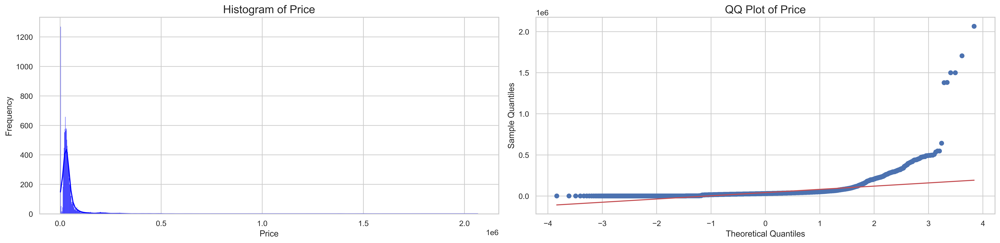

In [53]:
## Histogram and QQplot for the target variable
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.histplot(car_price_data['Price'], kde=True, color='blue', alpha=0.8)
plt.title('Histogram of Price', fontsize=16)
plt.xlabel('Price', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.subplot(1, 2, 2)
stats.probplot(car_price_data['Price'], dist="norm", plot=plt)
plt.title('QQ Plot of Price', fontsize=16)
plt.xlabel('Theoretical Quantiles', fontsize=12)
plt.ylabel('Sample Quantiles', fontsize=12)
plt.tight_layout()
plt.show()

**With a skewness value greater than 1, indicating a positively skewed distribution — supported by the histogram and QQ plot — it is evident that a few high-priced cars are pulling the average to the right. This skewness can distort statistical analysis and predictive modeling. Applying a log transformation (e.g., `np.log1p`) can help normalize the distribution, reduce the influence of extreme values, and improve model performance.**


In [54]:
## Dropping columns  
columns_to_drop = ['Model','Market_Category','Vehicle_Style']
car_price_data.drop(columns=columns_to_drop,inplace=True)
## displaying the data  
car_price_data.head()

,Brand,Year,Fuel_Type,Horsepower,Cylinders,Transmission,Drive_Type,Doors,Vehicle_Size,Highway_MPG,city_mpg,Popularity,Price
0,BMW,2011,premium unleaded (required),335.00,6.00,MANUAL,rear wheel drive,2.00,Compact,26,19,3916,46135
1,BMW,2011,premium unleaded (required),300.00,6.00,MANUAL,rear wheel drive,2.00,Compact,28,19,3916,40650
2,BMW,2011,premium unleaded (required),300.00,6.00,MANUAL,rear wheel drive,2.00,Compact,28,20,3916,36350
3,BMW,2011,premium unleaded (required),230.00,6.00,MANUAL,rear wheel drive,2.00,Compact,28,18,3916,29450
4,BMW,2011,premium unleaded (required),230.00,6.00,MANUAL,rear wheel drive,2.00,Compact,28,18,3916,34500


In [55]:
## train test split  
X = car_price_data.drop(columns=['Price'])
## log transforming the target variable
y = car_price_data['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### **CREATING THE PIPELINE**

In [56]:
## DEFINING THEE NUMERIC COLUMNS 
numeric_columns = ['Year','Horsepower','Cylinders','Doors','Highway_MPG','city_mpg','Popularity']
## CATEGORICAL COLUMNS
categorical_columns = ['Fuel_Type','Transmission', 'Drive_Type', 'Vehicle_Size','Brand']

In [57]:
## numeric pipeline
numeric_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('winsorizer', Winsorizer(capping_method='quantiles', tail='both', fold=0.01)),
    ('scaler', StandardScaler())
])
##  categorical pipeline
categorical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])
## defining the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_pipeline, numeric_columns),
        ('cat', categorical_pipeline, categorical_columns)
    ]
)
# Define the model
lr_model = LinearRegression()
# Create the pipeline
lr_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', lr_model)
])
lr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model', LinearRegression())])

In [58]:
## making predictions on the test set
y_pred_lr = lr_pipeline.predict(X_test)


In [59]:
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_lr),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_lr),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_lr)),2))
print("R² Score:",r2_score(y_test, y_pred_lr))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_lr))

MAE: 9528.25
MSE: 279420697.84
RMSE: 16715.88
R² Score: 0.8529685780953347
MAPE 0.6650895749203253


### **EFFECT OF LOG TRANSFORMING TARGET LINEARREGRESSION**

In [60]:
## log trasformed Linear Regression  
lr_log = TransformedTargetRegressor(
    regressor=LinearRegression(),
    func=np.log1p,
    inverse_func=np.expm1
)
## creating the pipeline
lr_log_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', lr_log)
])
## fitting the model
lr_log_pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=LinearRegression()))])

In [61]:
## making predictions on the test set
y_pred_lr_log = lr_log_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_lr_log),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_lr_log),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_lr_log)),2))
print("R² Score:",r2_score(y_test, y_pred_lr_log))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_lr_log))
# Use the pipeline to handle missing values and transformations

MAE: 10477.9
MSE: 506039038.14
RMSE: 22495.31
R² Score: 0.7337218041036252
MAPE 0.3370219292478513


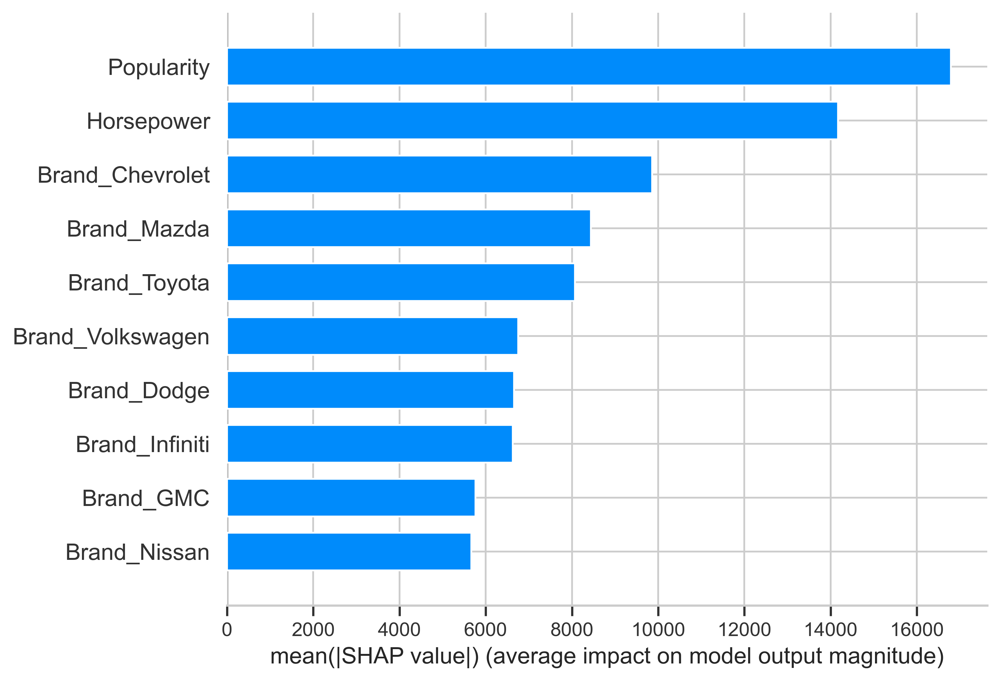

In [62]:
## shap values for interpretability

# Preprocess the data using the pipeline's preprocessor
X_train_transformed = lr_pipeline.named_steps['preprocessor'].transform(X_train)
X_test_transformed = lr_pipeline.named_steps['preprocessor'].transform(X_test)

# Get feature names after preprocessing
num_features = lr_pipeline.named_steps['preprocessor'].transformers_[0][2]
cat_features = lr_pipeline.named_steps['preprocessor'].transformers_[1][2]
cat_encoder = lr_pipeline.named_steps['preprocessor'].transformers_[1][1].named_steps['encoder']
cat_feature_names = cat_encoder.get_feature_names_out(cat_features)
feature_names = list(num_features) + list(cat_feature_names)

# Use the underlying linear model for SHAP
explainer = shap.Explainer(lr_pipeline.named_steps['model'], X_train_transformed, feature_names=feature_names)
shap_values = explainer(X_test_transformed)
shap.summary_plot(shap_values, features=X_test_transformed, feature_names=feature_names, plot_type="bar", max_display=10)

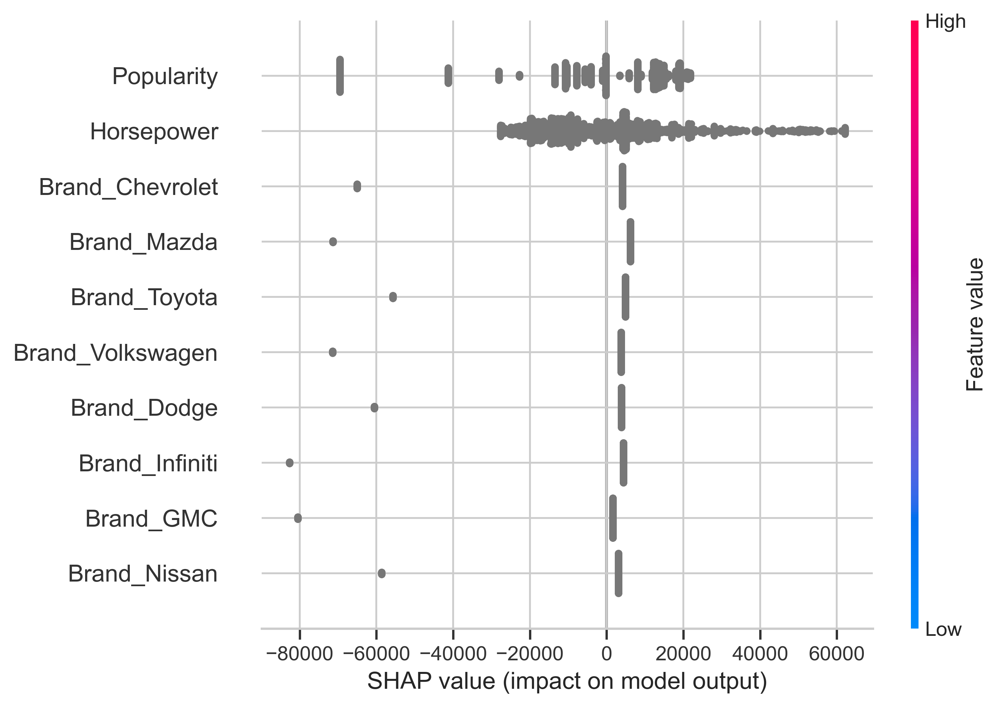

In [63]:
## swarm plot
shap.summary_plot(shap_values, features=X_test_transformed, feature_names=feature_names, plot_type="dot", max_display=10)


### **XGBOOST PIPELINE**

In [64]:
## Xgboosst pipeline  
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', xgb_model) 
])
xgb_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

In [65]:
## predicting on the test set
y_pred_xgb = xgb_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_xgb),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_xgb),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_xgb)),2))
print("R² Score:",r2_score(y_test, y_pred_xgb))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_xgb))

## Actual vs Predicted

MAE: 3552.15
MSE: 42086420.0
RMSE: 6487.4
R² Score: 0.9778540730476379
MAPE 0.12207931280136108


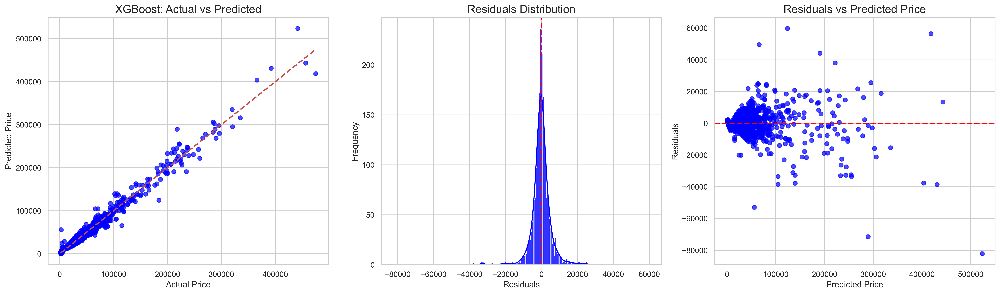

In [66]:
##  Actual vs Predicted plot
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred_xgb, color='blue', alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('XGBoost: Actual vs Predicted', fontsize=16) 
## residuals on the second axis  
plt.subplot(1, 3, 2)
residuals = y_test - y_pred_xgb
sns.histplot(residuals, kde=True, color='blue', alpha=0.8)
plt.axvline(0, color='red', linestyle='--', lw=2)
plt.title('Residuals Distribution', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
## scatter plot of residuals
plt.subplot(1, 3, 3)
plt.scatter(y_pred_xgb, residuals, color='blue', alpha=0.7)
plt.axhline(0, color='red', linestyle='--', lw=2)
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Price', fontsize=16)
plt.tight_layout()
plt.show()


### **EFFECT OF LOG TRANSFOTMING TARGET XGBOOST**

In [67]:
## transforming the target variable
xgb_boost_log = TransformedTargetRegressor(
    regressor=XGBRegressor(objective='reg:squarederror', random_state=42),
    func=np.log1p,
    inverse_func=np.expm1
)
## creating the pipeline
xgb_boost_log_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', xgb_boost_log)
])
## fitting the model
xgb_boost_log_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(...
                                                                   grow_policy=None,
                                                                   importance_type=None,
                                                                   interaction_constraints=None,
                                                                   learning_rate=None,
                                                                   max_bin=None,
                                                                   max_cat_threshold=None,
                                                                   max_cat_to_onehot=None,
                                                                   max_delta_step=None,
                                                                   max_depth=None,
                                                                   max_leaves=None,
                                                                   min_child_weight=None,
                                                                   missing=nan,
                                                                   monotone_constraints=None,
                                                                   multi_strategy=None,
                                                                   n_estimators=None,
                                                                   n_jobs=None,
                                                                   num_parallel_tree=None,
                                                                   random_state=42, ...)))])

In [68]:
## making predictions on the test set
y_pred_xgb = xgb_boost_log_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_xgb),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_xgb),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_xgb)),2))
print("R² Score:",r2_score(y_test, y_pred_xgb))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_xgb))


MAE: 3518.83
MSE: 58082336.0
RMSE: 7621.18
R² Score: 0.9694370031356812
MAPE 0.08011534810066223


### **LIGHTGBM**

In [69]:
## lightgbm pipeline
lgbm_model = LGBMRegressor(objective='regression', random_state=42,force_row_wise=True)
lgbm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', lgbm_model)
])
lgbm_pipeline.fit(X_train, y_train)


  File "d:\tong_1\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "D:\python\Lib\subprocess.py", line 556, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\Lib\subprocess.py", line 1038, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
                        pass_fds, cwd, env,
                        ^^^^^^^^^^^^^^^^^^^
    ...<5 lines>...
                        gid, gids, uid, umask,
                        ^^^^^^^^^^^^^^^^^^^^^^
                        start_new_session, process_group)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "D:\python\Lib\subprocess.py", line 1550, in _execute_child
    hp, ht, pid, tid = _wi

[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 8949, number of used features: 65
[LightGBM] [Info] Start training from score 42405.062353


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model',
                 LGBMRegressor(force_row_wise=True, objective='regression',
                               random_state=42))])

In [70]:
## making predictions on the test set
y_pred_lgbm = lgbm_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_lgbm),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_lgbm),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_lgbm)),2))
print("R² Score:",r2_score(y_test, y_pred_lgbm))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_lgbm))


MAE: 4522.04
MSE: 155576802.47
RMSE: 12473.04
R² Score: 0.9181353469534896
MAPE 0.1682017952355286


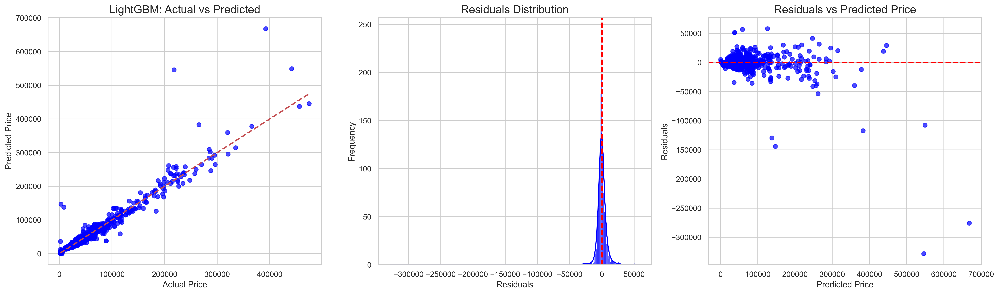

In [71]:
## checking for the distribution of residuals
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred_lgbm, color='blue', alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('LightGBM: Actual vs Predicted', fontsize=16)
## residuals on the second axis
plt.subplot(1, 3, 2)
residuals = y_test - y_pred_lgbm
sns.histplot(residuals, kde=True, color='blue', alpha=0.8)
plt.axvline(0, color='red', linestyle='--', lw=2)
plt.title('Residuals Distribution', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
## scatter plot of residuals
plt.subplot(1, 3, 3)
plt.scatter(y_pred_lgbm, residuals, color='blue', alpha=0.7)
plt.axhline(0, color='red', linestyle='--', lw=2)
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Price', fontsize=16)
plt.tight_layout()
plt.show()

#### **RandomForest**

In [72]:
## Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', rf_model)
])
rf_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model', RandomForestRegressor(random_state=42))])

In [73]:
## Evaluating the model
y_pred_rf = rf_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_rf),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_rf),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_rf)),2))
print("R² Score:",r2_score(y_test, y_pred_rf))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_rf))


MAE: 3539.39
MSE: 63621468.16
RMSE: 7976.31
R² Score: 0.966522326370992
MAPE 0.0949568874591181


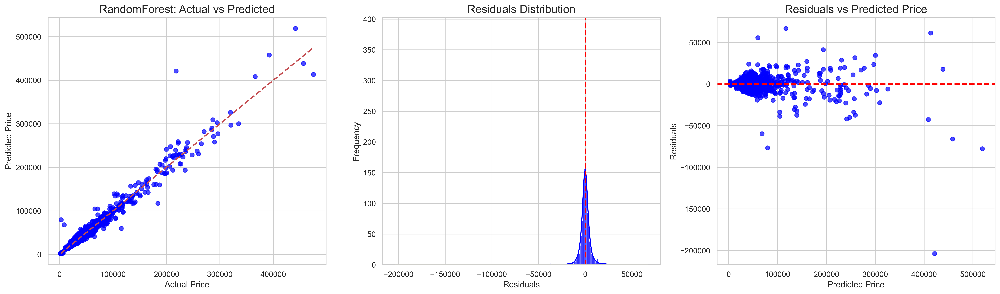

In [74]:
## checking for the distribution of residuals
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred_rf, color='blue', alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('RandomForest: Actual vs Predicted', fontsize=16)
## residuals on the second axis
plt.subplot(1, 3, 2)
residuals = y_test - y_pred_rf
sns.histplot(residuals, kde=True, color='blue', alpha=0.8)
plt.axvline(0, color='red', linestyle='--', lw=2)
plt.title('Residuals Distribution', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
## scatter plot of residuals
plt.subplot(1, 3, 3)
plt.scatter(y_pred_rf, residuals, color='blue', alpha=0.7)
plt.axhline(0, color='red', linestyle='--', lw=2)
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Price', fontsize=16)
plt.tight_layout()
plt.show()

### **SVM**

In [75]:
## svm pipeline
svm_model = SVR(kernel='linear')
svm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', svm_model)
])
svm_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model', SVR(kernel='linear'))])

In [76]:
## Evaluating the model
y_pred_svm = svm_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_svm),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_svm),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_svm)),2))
print("R² Score:",r2_score(y_test, y_pred_svm))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_svm))


MAE: 15921.82
MSE: 1487281969.31
RMSE: 38565.29
R² Score: 0.21739089333718842
MAPE 1.0736338648918593


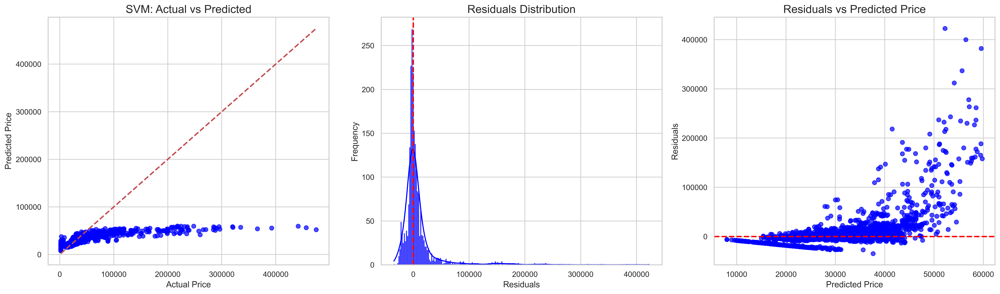

In [77]:
## checking for the distribution of residuals
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred_svm, color='blue', alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('SVM: Actual vs Predicted', fontsize=16)
## residuals on the second axis
plt.subplot(1, 3, 2)
residuals = y_test - y_pred_svm
sns.histplot(residuals, kde=True, color='blue', alpha=0.8)
plt.axvline(0, color='red', linestyle='--', lw=2)
plt.title('Residuals Distribution', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
## scatter plot of residuals
plt.subplot(1, 3, 3)
plt.scatter(y_pred_svm, residuals, color='blue', alpha=0.7)
plt.axhline(0, color='red', linestyle='--', lw=2)
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Price', fontsize=16)
plt.tight_layout()
plt.show()

### **EFFECT OF LOG TRANSFORMATION SVM**

In [78]:
## log transformed SVM
svm_log = TransformedTargetRegressor(
    regressor=SVR(kernel='linear'),
    func=np.log1p,
    inverse_func=np.expm1
)
## creating the pipeline
svm_log_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', svm_log)
])
## fitting the model
svm_log_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=SVR(kernel='linear')))])

In [79]:
## making predictions on the test set
y_pred_svm_log = svm_log_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_svm_log),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_svm_log),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_svm_log)),2))
print("R² Score:",r2_score(y_test, y_pred_svm_log))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_svm_log))

MAE: 9560.49
MSE: 444249913.01
RMSE: 21077.24
R² Score: 0.7662352971878252
MAPE 0.342322600015513


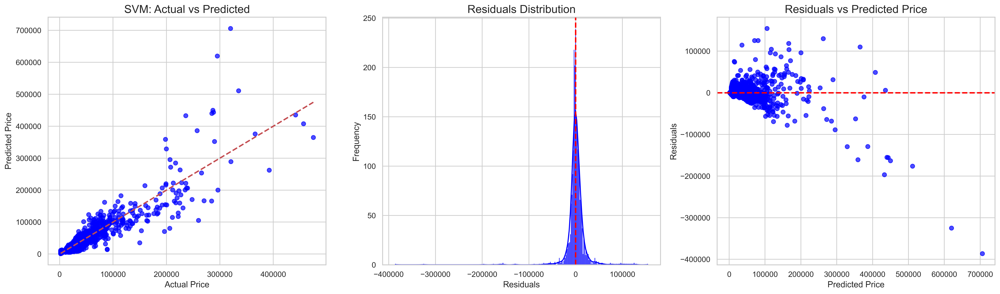

In [80]:
## checking for the distribution of residuals
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred_svm_log, color='blue', alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('SVM: Actual vs Predicted', fontsize=16)
## residuals on the second axis
plt.subplot(1, 3, 2)
residuals = y_test - y_pred_svm_log
sns.histplot(residuals, kde=True, color='blue', alpha=0.8)
plt.axvline(0, color='red', linestyle='--', lw=2)
plt.title('Residuals Distribution', fontsize=16)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
## scatter plot of residuals
plt.subplot(1, 3, 3)
plt.scatter(y_pred_svm_log, residuals, color='blue', alpha=0.7)
plt.axhline(0, color='red', linestyle='--', lw=2)
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Price', fontsize=16)
plt.tight_layout()
plt.show()

### **CATBOOST REGRESSOR**

In [81]:
## catboost pipeline
catboost_model = CatBoostRegressor(silent=True, random_state=42)
catboost_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', catboost_model)
])
catboost_pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model',
                 <catboost.core.CatBoostRegressor object at 0x000001DE0AD49D30>)])

In [82]:
## Evalauting the model  
y_pred_catboost = catboost_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_catboost),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_catboost),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_catboost)),2))
print("R² Score:",r2_score(y_test, y_pred_catboost))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_catboost))
## checking for the distribution of residuals

MAE: 3797.84
MSE: 57521378.69
RMSE: 7584.28
R² Score: 0.9697321989242121
MAPE 0.13829045368191673


### **STACKING MODELS**

In [83]:
## model stacking  
## creating the base models with only 2 models
base_models = [
    ('xgb', XGBRegressor(objective='reg:squarederror', random_state=42)),
    ('rf', RandomForestRegressor(random_state=42))
]
## creating the meta model
meta_model = LinearRegression()
## creating the stacking regressor
stacking_model = StackingRegressor(
    estimators=base_models,
    final_estimator=meta_model,
    cv=5
)
## creating the pipeline
stacking_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', stacking_model)
])
stacking_pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(...
                                                             max_bin=None,
                                                             max_cat_threshold=None,
                                                             max_cat_to_onehot=None,
                                                             max_delta_step=None,
                                                             max_depth=None,
                                                             max_leaves=None,
                                                             min_child_weight=None,
                                                             missing=nan,
                                                             monotone_constraints=None,
                                                             multi_strategy=None,
                                                             n_estimators=None,
                                                             n_jobs=None,
                                                             num_parallel_tree=None,
                                                             random_state=42, ...)),
                                               ('rf',
                                                RandomForestRegressor(random_state=42))],
                                   final_estimator=LinearRegression()))])

In [84]:
## Evaluating the model
y_pred_stacking = stacking_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_stacking),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_stacking),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_stacking)),2))
print("R² Score:",r2_score(y_test, y_pred_stacking))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_stacking))



MAE: 3636.5
MSE: 66778213.47
RMSE: 8171.79
R² Score: 0.9648612441587584
MAPE 0.11702913255186392


### **MLP REGRESSOR**

In [85]:
##  MLP REGRESSOR
from sklearn.neural_network import MLPRegressor
## creating the model
mlp_model = MLPRegressor(random_state=42, max_iter=1000,hidden_layer_sizes=(100,50),activation='relu')
## creating the pipeline
mlp_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', mlp_model)
])
mlp_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('winsorizer',
                                                                   Winsorizer(capping_method='quantiles',
                                                                              fold=0.01,
                                                                              tail='both')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Year', 'Horsepower',
                                                   'Cylinders', 'Doors',
                                                   'Highway_MPG', 'city_mpg',
                                                   'Popularity']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Fuel_Type', 'Transmission',
                                                   'Drive_Type', 'Vehicle_Size',
                                                   'Brand'])])),
                ('model',
                 MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000,
                              random_state=42))])

In [86]:
## Evaluating the model
y_pred_mlp = mlp_pipeline.predict(X_test)
## metrics
print("MAE:", round(mean_absolute_error(y_test, y_pred_mlp),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_mlp),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_mlp)),2))
print("R² Score:",r2_score(y_test, y_pred_mlp))
print("MAPE",mean_absolute_percentage_error(y_test, y_pred_mlp))

MAE: 6000.25
MSE: 209195505.1
RMSE: 14463.59
R² Score: 0.8899211375233225
MAPE 0.3321380880515408


### **MODEL COMPARISON**

In [87]:

# Transform your data
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Convert to dense DataFrame
X_train_preprocessed = pd.DataFrame(X_train_preprocessed.toarray())
X_test_preprocessed = pd.DataFrame(X_test_preprocessed.toarray())

lazy_reg = LazyRegressor(verbose=0, ignore_warnings=True)
models, predictions = lazy_reg.fit(X_train_preprocessed, X_test_preprocessed, y_train, y_test)


  0%|          | 0/42 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 576
[LightGBM] [Info] Number of data points in the train set: 8949, number of used features: 65
[LightGBM] [Info] Start training from score 42405.062353


In [88]:
models.head(10)

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
XGBRegressor,0.98,0.98,6498.67,2.27
ExtraTreesRegressor,0.97,0.98,6842.46,15.44
RandomForestRegressor,0.97,0.97,7976.31,13.16
ExtraTreeRegressor,0.96,0.97,8112.32,0.27
DecisionTreeRegressor,0.96,0.96,8612.08,0.29
BaggingRegressor,0.95,0.95,9262.94,1.32
KNeighborsRegressor,0.94,0.94,10779.47,0.65
GradientBoostingRegressor,0.93,0.93,11257.00,4.33
LGBMRegressor,0.92,0.92,12473.04,0.92


In [89]:
## filtered models  
filtered_models = models.loc[['XGBRegressor', 'RandomForestRegressor',  'LGBMRegressor', 'SVR', 'MLPRegressor','LinearRegression','DecisionTreeRegressor','KNeighborsRegressor','GradientBoostingRegressor','HuberRegressor']]
filtered_models = filtered_models.sort_values(by='R-Squared', ascending=True)
filtered_models

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
SVR,-0.08,-0.04,44528.57,25.36
MLPRegressor,0.64,0.65,25688.38,54.83
LinearRegression,0.85,0.85,16716.02,0.18
HuberRegressor,0.85,0.86,16551.66,1.66
LGBMRegressor,0.92,0.92,12473.04,0.92
GradientBoostingRegressor,0.93,0.93,11257.00,4.33
KNeighborsRegressor,0.94,0.94,10779.47,0.65
DecisionTreeRegressor,0.96,0.96,8612.08,0.29
RandomForestRegressor,0.97,0.97,7976.31,13.16


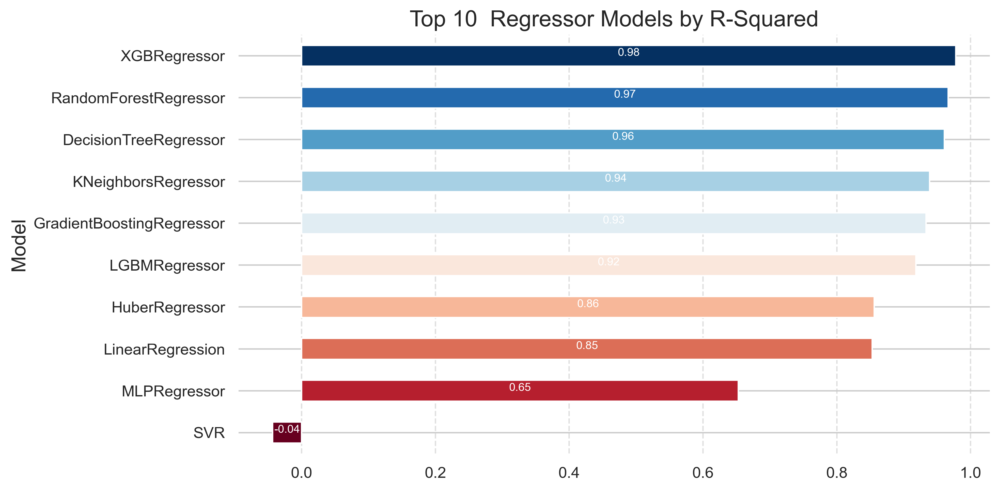

In [90]:
plt.figure(figsize=(10, 5))
ax = filtered_models['R-Squared'].head(10).plot(kind='barh', color=plt.cm.RdBu(np.linspace(0, 1, 10)))
plt.title('Top 10  Regressor Models by R-Squared', fontsize=16)
plt.xlabel('')
plt.ylabel('Model', fontsize=14)
plt.xticks(rotation=0)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
for spine in ["top","right","bottom","left"]:
    plt.gca().spines[spine].set_visible(False)
for patch in ax.patches:
    plt.text(
        patch.get_x() + patch.get_width() / 2,  
        patch.get_y() + patch.get_height() / 2, 
        f'{patch.get_width():.2f}',  
        ha='center',  
        fontsize=8,
        color='white'  

    )
plt.show()

#### **PRICIPAL COMPONENT ANALYSIS**

In [91]:
# ## Principal Component Analyssis in Pipeline 
# ## numeric pipeline
# numeric_pipeline = Pipeline(steps=[
#     ('imputer', SimpleImputer(strategy='mean')),
#     ('winsorizer', Winsorizer(capping_method='quantiles', tail='both', fold=0.01)),
#     ('scaler', StandardScaler())
# ])
# ##  categorical pipeline
# categorical_pipeline = Pipeline(steps=[
#     ('imputer', SimpleImputer(strategy='most_frequent')),
#     ('target', TargetEncoder(random_state=42)),
# ])
# ## defining the preprocessor
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('num', numeric_pipeline, numeric_columns),
#         ('cat', categorical_pipeline, categorical_columns)
#     ]
# )
# # Define the model
# lr_model_pca = LinearRegression()
# # Create the pipeline
# lr_pipeline_pca = Pipeline(steps=[
#     ('preprocessor', preprocessor),
#     # ('pca', PCA(n_components=0.95,svd_solver='covariance_eigh',random_state=42)),  
#     ('model', lr_model_pca)
# ])
# lr_pipeline_pca.fit(X_train, y_train)

In [92]:
# ### Evaluating the model with PCA
# y_pred_lr_pca = lr_pipeline_pca.predict(X_test)
# ## metrics
# print("MAE:", round(mean_absolute_error(y_test, y_pred_lr_pca),2))
# print("MSE:", round(mean_squared_error(y_test, y_pred_lr_pca),2))
# print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_lr_pca)),2))
# print("R² Score:",r2_score(y_test, y_pred_lr_pca))
# print("MAPE",mean_absolute_percentage_error(y_test, y_pred_lr_pca))


### **XGBOOST**

In [93]:
# ## XGBoost with PCA
# xgb_model_pca = XGBRegressor(objective='reg:squarederror', random_state=42)
# xgb_pipeline_pca = Pipeline(steps=[
#     ('preprocessor', preprocessor),
#     ('pca', PCA(n_components=0.95,svd_solver='covariance_eigh',random_state=42)),  
#     ('model', xgb_model_pca)
# ])
# xgb_pipeline_pca.fit(X_train, y_train)


In [94]:
# ## making predictions on the test set
# y_pred_xgb_pca = xgb_pipeline_pca.predict(X_test)
# ## metrics
# print("MAE:", round(mean_absolute_error(y_test, y_pred_xgb_pca),2))
# print("MSE:", round(mean_squared_error(y_test, y_pred_xgb_pca),2))
# print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_xgb_pca)),2))
# print("R² Score:",r2_score(y_test, y_pred_xgb_pca))
# print("MAPE",mean_absolute_percentage_error(y_test, y_pred_xgb_pca))

### **HYPERAMETER TUNNING ON XGBOOST**

In [95]:
## Hyperameter tunning on xgbooost 
xgb_param_grid = {
    'model__n_estimators': [100, 200],
    'model__max_depth': [3, 5, 6, 7],
    'model__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'model__subsample': [0.8, 1.0],
    'model__colsample_bytree': [0.8, 1.0]
}

## performing grid search with cross-validation
xgb_grid_search = GridSearchCV(
    estimator=xgb_pipeline,
    param_grid=xgb_param_grid,
    scoring='neg_mean_squared_error',
    cv=5,
    verbose=1,
    n_jobs=-1
)
## fitting the grid search
xgb_grid_search.fit(X_train, y_train)



Fitting 5 folds for each of 128 candidates, totalling 640 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer()),
                                                                                         ('winsorizer',
                                                                                          Winsorizer(capping_method='quantiles',
                                                                                                     fold=0.01,
                                                                                                     tail='both')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['Year',
                                                                          'Horsepower',
                                                                          'Cylinders',
                                                                          'Doors',
                                                                          'Highway_MPG',
                                                                          'city_mpg',
                                                                          'Popularity']),
                                                                        ('cat',
                                                                         Pipeline(step...
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=42, ...))]),
             n_jobs=-1,
             param_grid={'model__colsample_bytree': [0.8, 1.0],
                         'model__learning_rate': [0.01, 0.1, 0.2, 0.3],
                         'model__max_depth': [3, 5, 6, 7],
                         'model__n_estimators': [100, 200],
                         'model__subsample': [0.8, 1.0]},
             scoring='neg_mean_squared_error', verbose=1)

In [96]:
# Get the best parameters and score
best_params = xgb_grid_search.best_params_
best_score = -xgb_grid_search.best_score_
best_model = xgb_grid_search.best_estimator_

In [97]:
print("Best Parameters:", best_params)
print("Best Score (MSE):", best_score)

Best Parameters: {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.2, 'model__max_depth': 3, 'model__n_estimators': 200, 'model__subsample': 1.0}
Best Score (MSE): 497845907.2


In [98]:
# Make predictions with the best model
y_pred_best_xgb = best_model.predict(X_test)

In [99]:
# Evaluate the best model
print("MAE:", round(mean_absolute_error(y_test, y_pred_best_xgb),2))
print("MSE:", round(mean_squared_error(y_test, y_pred_best_xgb),2))
print("RMSE:", round(np.sqrt(mean_squared_error(y_test, y_pred_best_xgb)),2))
print("R² Score:", r2_score(y_test, y_pred_best_xgb))
print("MAPE", mean_absolute_percentage_error(y_test, y_pred_best_xgb))


MAE: 4712.25
MSE: 80267576.0
RMSE: 8959.22
R² Score: 0.957763135433197
MAPE 0.19005750119686127


#### <p style="background-color:#0089bf; font-family:'Times New Roman', cursive; color:#FFFFFF; font-size:120%; text-align:center; border: 3px solid #FFEB3B; border-radius:40px; padding: 10px;"> MODEL DEPLOYMENT</p>

In [100]:
## save using pickle
import pickle
# Save the best model to a file 
with open('xgb_pipeline.pkl', 'wb') as file:
    pickle.dump(xgb_pipeline, file)
